Test allignment between ALHIC2416 and ALHIC2401

Currently crude - just average at each depth

In [18]:
#%% Import packages 

# general
import numpy as np
import pandas as pd

# plotting
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# my functions/classes
import sys
sys.path.append("../core_scripts/")
from ECMclass import ECM

In [19]:
# smoothing window, mm
window = 10

# paths
path_to_data = '../../data/'
path_to_figures = '../../../figures/cul_de_sac/'
metadata_file = 'metadata.csv'

In [20]:
#%% Read in metadata and import data

meta = pd.read_csv(path_to_data+metadata_file)

# import each script as an ECM class item
data = []
cores = []
sections = []
faces = []
ACorDCs = []
for index,row in meta.iterrows():
    
    core = row['core']
    section = row['section']
    face = row['face']
    ACorDC = row['ACorDC']
    
    if core == 'alhic2401' or core == 'alhic2416' or core == 'alhic2301':
        
        print("Reading "+core+", section "+section+'-'+face+'-'+ACorDC)
    
        data_item = ECM(core,section,face,ACorDC)
        data_item.rem_ends(30)
        #data_item.smooth(window)
        #data_item.norm_all()
        #data_item.norm_outside()
        data.append(data_item)
        
        cores.append(core)
        sections.append(section)
        faces.append(face)
        ACorDCs.append(ACorDC)

sec = set(sections)

Reading alhic2401, section 1-w1-AC
Reading alhic2401, section 1-w1-DC
Reading alhic2401, section 1-w2-AC
Reading alhic2401, section 1-w2-DC
Reading alhic2401, section 10-w1-AC
Reading alhic2401, section 10-w1-DC
Reading alhic2401, section 10-w2-AC
Reading alhic2401, section 10-w2-DC
Reading alhic2401, section 13-w1-AC
Reading alhic2401, section 13-w1-DC
Reading alhic2401, section 13-w2-AC
Reading alhic2401, section 13-w2-DC
Reading alhic2401, section 14-w1-AC
Reading alhic2401, section 14-w1-DC
Reading alhic2401, section 14-w2-AC
Reading alhic2401, section 14-w2-DC
Reading alhic2401, section 15-w1-AC
Reading alhic2401, section 15-w1-DC
Reading alhic2401, section 15-w2-AC
Reading alhic2401, section 15-w2-DC
Reading alhic2401, section 16-w1-AC
Reading alhic2401, section 16-w1-DC
Reading alhic2401, section 16-w2-AC
Reading alhic2401, section 16-w2-DC
Reading alhic2401, section 17-w1-AC
Reading alhic2401, section 17-w1-DC
Reading alhic2401, section 17-w2-AC
Reading alhic2401, section 17-w2

In [21]:
depth_alhic2401_AC = []
depth_alhic2401_DC = []
meas_ALHIC2401_AC = []
meas_ALHIC2401_DC = []

depth_alhic2416_AC = []
depth_alhic2416_DC = []
meas_ALHIC2416_AC = []
meas_ALHIC2416_DC = []

depth_alhic2301_AC = []
depth_alhic2301_DC = []
meas_ALHIC2301_AC = []
meas_ALHIC2301_DC = []

for d in data:
    button_idx = d.button == 0
    depth = d.depth[button_idx].tolist()
    meas = d.meas[button_idx].tolist()

    if d.core == 'alhic2401':
        print("Running core "+d.core+" section "+d.section)
        if d.ACorDC == 'AC':
            for i in range(len(depth)):
                depth_alhic2401_AC.append(depth[i])
                meas_ALHIC2401_AC.append(meas[i])
        else:
            for i in range(len(depth)):
                depth_alhic2401_DC.append(depth[i])
                meas_ALHIC2401_DC.append(meas[i])
    elif d.core == 'alhic2416':
        if d.ACorDC == 'AC':
            for i in range(len(depth)):
                depth_alhic2416_AC.append(depth[i])
                meas_ALHIC2416_AC.append(meas[i])
        else:
            for i in range(len(depth)):
                depth_alhic2416_DC.append(depth[i])
                meas_ALHIC2416_DC.append(meas[i])
    elif d.core == 'alhic2301':
        if d.ACorDC == 'AC':
            for i in range(len(depth)):
                depth_alhic2301_AC.append(depth[i])
                meas_ALHIC2301_AC.append(meas[i])
        else:
            for i in range(len(depth)):
                depth_alhic2301_DC.append(depth[i])
                meas_ALHIC2301_DC.append(meas[i])
    else:
        print("Error: Invalid core")



Running core alhic2401 section 1
Running core alhic2401 section 1
Running core alhic2401 section 1
Running core alhic2401 section 1
Running core alhic2401 section 10
Running core alhic2401 section 10
Running core alhic2401 section 10
Running core alhic2401 section 10
Running core alhic2401 section 13
Running core alhic2401 section 13
Running core alhic2401 section 13
Running core alhic2401 section 13
Running core alhic2401 section 14
Running core alhic2401 section 14
Running core alhic2401 section 14
Running core alhic2401 section 14
Running core alhic2401 section 15
Running core alhic2401 section 15
Running core alhic2401 section 15
Running core alhic2401 section 15
Running core alhic2401 section 16
Running core alhic2401 section 16
Running core alhic2401 section 16
Running core alhic2401 section 16
Running core alhic2401 section 17
Running core alhic2401 section 17
Running core alhic2401 section 17
Running core alhic2401 section 17
Running core alhic2401 section 19
Running core alhic

In [22]:
def get_ave(depth,meas):

    min_depth = round(min(depth),2)
    max_depth = round(max(depth),2)
    d = np.linspace(min_depth,max_depth,int((max_depth-min_depth)*100+1))

    # sort depth and meas
    depth, meas = zip(*sorted(zip(depth, meas)))
    

    m = []
    lo = 0
    hi = 0
    for i in range(len(d)):

        lo = hi

        while hi<len(depth) and depth[hi] < d[i] + 0.005:
            hi += 1

        # get average of the measurements of elements in the list with index between lo and hi-1
        m.append(np.median(meas[lo:hi-1]))


    return d,m

In [23]:
# compute averages
DC_d_2401,DC_m_2401 = get_ave(depth_alhic2401_DC,meas_ALHIC2401_DC)
AC_d_2401,AC_m_2401 = get_ave(depth_alhic2401_AC,meas_ALHIC2401_AC)
DC_d_2416,DC_m_2416 = get_ave(depth_alhic2416_DC,meas_ALHIC2416_DC)
AC_d_2416,AC_m_2416 = get_ave(depth_alhic2416_AC,meas_ALHIC2416_AC)
DC_d_2301,DC_m_2301 = get_ave(depth_alhic2301_DC,meas_ALHIC2301_DC)
AC_d_2301,AC_m_2301 = get_ave(depth_alhic2301_AC,meas_ALHIC2301_AC)

/Users/Liam/anaconda3/envs/ecm/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/Liam/anaconda3/envs/ecm/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


/var/folders/b3/ghp5pyzj7_x9mhrs3x202bm80000gn/T/ipykernel_6934/3077804977.py:52: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax[i].set_xlim([0, 4e-6])


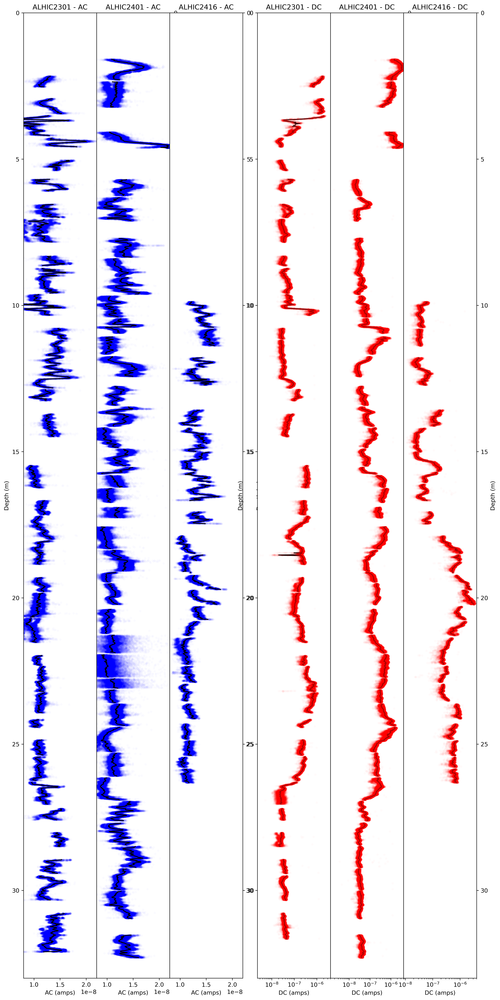

In [24]:
fig, ax = plt.subplots(
    1, 7, figsize=(14, 30), dpi=300,
    gridspec_kw={'width_ratios': [1, 1, 1, .2, 1, 1, 1]}
)

# turn off the middle spacer
ax[3].axis('off')

# put right‐side y axes on AC[1,2] and DC[5,6]
for i in (1, 2, 5, 6):
    ax[i].yaxis.tick_right()
    ax[i].yaxis.set_label_position("right")

# common y‐labels & limits on all real axes
for i in (0, 1, 2, 4, 5, 6):
    ax[i].set_ylabel('Depth (m)')
    ax[i].set_ylim([33, 0])

fig.subplots_adjust(wspace=0)


# --- AC panels in order 2301, 2401, 2416 ---
# raw points
ax[0].plot(meas_ALHIC2301_AC, depth_alhic2301_AC, '.', alpha=0.01, color='blue')
ax[1].plot(meas_ALHIC2401_AC, depth_alhic2401_AC, '.', alpha=0.01, color='blue')
ax[2].plot(meas_ALHIC2416_AC, depth_alhic2416_AC, '.', alpha=0.01, color='blue')
# median lines
ax[0].plot(AC_m_2301, AC_d_2301, color='k', label='AC')
ax[1].plot(AC_m_2401, AC_d_2401, color='k', label='AC')
ax[2].plot(AC_m_2416, AC_d_2416, color='k', label='AC')

for i, core in zip((0, 1, 2), ('2301', '2401', '2416')):
    ax[i].set_title(f'ALHIC{core} - AC')
    ax[i].set_xlabel('AC (amps)')
    ax[i].set_xlim([0.8e-8, 2.2e-8])


# --- DC panels in order 2301, 2401, 2416 ---
# median lines
ax[4].plot(DC_m_2301, DC_d_2301, color='k', label='DC')
ax[5].plot(DC_m_2401, DC_d_2401, color='k', label='DC')
ax[6].plot(DC_m_2416, DC_d_2416, color='k', label='DC')
# raw points
ax[4].plot(meas_ALHIC2301_DC, depth_alhic2301_DC, '.', alpha=0.01, color='red')
ax[5].plot(meas_ALHIC2401_DC, depth_alhic2401_DC, '.', alpha=0.01, color='red')
ax[6].plot(meas_ALHIC2416_DC, depth_alhic2416_DC, '.', alpha=0.01, color='red')

for i, core in zip((4, 5, 6), ('2301', '2401', '2416')):
    ax[i].set_xscale('log')
    ax[i].set_title(f'ALHIC{core} - DC')
    ax[i].set_xlabel('DC (amps)')
    ax[i].set_xlim([0, 4e-6])


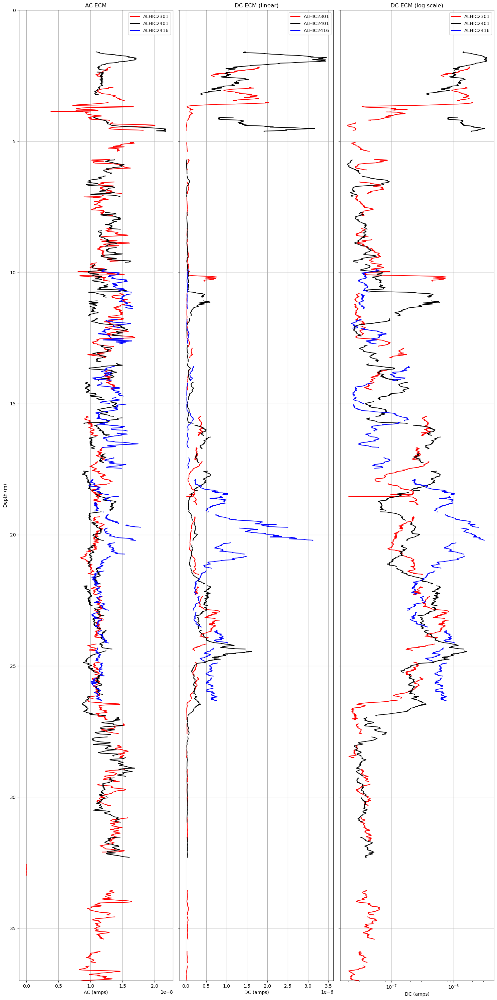

In [25]:
# plot median ECM profiles for AC and DC for cores 2301 and 2401, plus DC in log scale
fig, axes = plt.subplots(1, 3, figsize=(15, 30), sharey=True)

# AC subplot
axes[0].plot(AC_m_2301, AC_d_2301, color='red',   label='ALHIC2301')
axes[0].plot(AC_m_2401, AC_d_2401, color='black', label='ALHIC2401')
axes[0].plot(AC_m_2416, AC_d_2416, color='blue',  label='ALHIC2416')
axes[0].set_xlabel('AC (amps)')
axes[0].set_ylabel('Depth (m)')
axes[0].legend()
axes[0].set_title('AC ECM')
axes[0].set_ylim([37, 0])
axes[0].grid(True)

# DC linear subplot
axes[1].plot(DC_m_2301, DC_d_2301, color='red',   label='ALHIC2301')
axes[1].plot(DC_m_2401, DC_d_2401, color='black', label='ALHIC2401')
axes[1].plot(DC_m_2416, DC_d_2416, color='blue',  label='ALHIC2416')
axes[1].set_xlabel('DC (amps)')
axes[1].legend()
axes[1].set_title('DC ECM (linear)')
axes[1].set_ylim([37, 0])
axes[1].grid(True)

# DC log‐scale subplot
axes[2].plot(DC_m_2301, DC_d_2301, color='red',   label='ALHIC2301')
axes[2].plot(DC_m_2401, DC_d_2401, color='black', label='ALHIC2401')
axes[2].plot(DC_m_2416, DC_d_2416, color='blue',  label='ALHIC2416')
axes[2].set_xscale('log')
axes[2].set_xlabel('DC (amps)')
axes[2].legend()
axes[2].set_title('DC ECM (log scale)')
axes[2].set_ylim([37, 0])
axes[2].grid(True)

plt.tight_layout()

In [26]:
# load water isotope chip data
iso = pd.read_excel('ALHIC2301_chips_waterisotopes_UW_NOV2024.xlsx',sheet_name='data')
iso['Mid Depth'] = (iso['Top Depth'] + iso['Bottom Depth']) / 2

iso2 = pd.read_csv('alhic2401_chipsamples.csv')


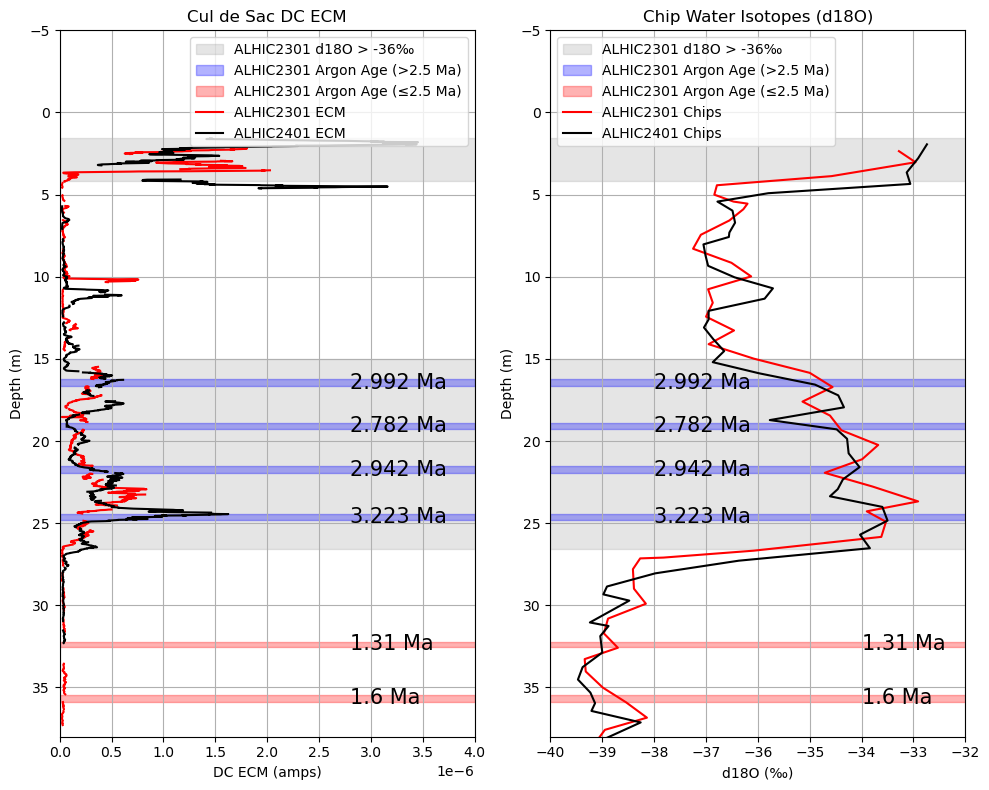

In [27]:
fig, ax = plt.subplots(1, 2, figsize=(10, 8))

# First subplot (unchanged)
Ar_ages = [3.223, 2.782, 2.992, 2.942, 1.310, 1.600]
Ar_top_depths = [24.43, 18.88, 16.25, 21.55, 32.21, 35.46]
Ar_bottom_depths = [24.83, 19.28, 16.65, 21.95, 32.55, 35.86]

# plot shade betwen
shade_between = [[1.55,4.2],[15,26.6]]
for i, shade in enumerate(shade_between):
    lbl = 'ALHIC2301 d18O > -36‰' if i == 0 else None
    ax[0].add_patch(Rectangle((0, shade[0]), 4e-6, shade[1] - shade[0],
                              color='gray', alpha=0.2, label=lbl))
    ax[1].add_patch(Rectangle((-40, shade[0]), 9, shade[1] - shade[0],
                                color='gray', alpha=0.2, label=lbl))


# seperate argon ages >2.5 Ma and < 2.5 Ma
Ar_ages_above_2_5 = [age for age in Ar_ages if age > 2.5]
Ar_ages_below_2_5 = [age for age in Ar_ages if age <= 2.5]
Ar_top_depths_above_2_5 = [Ar_top_depths[i] for i, age in enumerate(Ar_ages) if age > 2.5]
Ar_top_depths_below_2_5 = [Ar_top_depths[i] for i, age in enumerate(Ar_ages) if age <= 2.5]
Ar_bottom_depths_above_2_5 = [Ar_bottom_depths[i] for i, age in enumerate(Ar_ages) if age > 2.5]
Ar_bottom_depths_below_2_5 = [Ar_bottom_depths[i] for i, age in enumerate(Ar_ages) if age <= 2.5]  


i = 0
for age, top, bottom in zip(Ar_ages_above_2_5, Ar_top_depths_above_2_5, Ar_bottom_depths_above_2_5):
    lbl = 'ALHIC2301 Argon Age (>2.5 Ma)' if i == 0 else None
    text = f'{age} Ma'
    ax[0].add_patch(Rectangle((0, top), 4e-6, bottom - top,
                              color='blue', alpha=0.3, label=lbl))
    ax[0].text(4e-6 - 12e-7, (top + bottom) / 2, text,
               color='k', ha='left', va='center', fontsize=15)
    ax[1].add_patch(Rectangle((-40, top), 9, bottom - top,
                              color='blue', alpha=0.3, label=lbl))
    ax[1].text(-38, (top + bottom) / 2, text,
               color='k', ha='left', va='center', fontsize=15)
    i += 1

i = 0
for age, top, bottom in zip(Ar_ages_below_2_5, Ar_top_depths_below_2_5, Ar_bottom_depths_below_2_5):
    lbl = 'ALHIC2301 Argon Age (≤2.5 Ma)' if i == 0 else None
    text = f'{age} Ma'
    ax[0].add_patch(Rectangle((0, top), 4e-6, bottom - top,
                              color='red', alpha=0.3, label=lbl))
    ax[0].text(4e-6 - 12e-7, (top + bottom) / 2, text,
               color='k', ha='left', va='center', fontsize=15)
    ax[1].add_patch(Rectangle((-40, top), 9, bottom - top,
                              color='red', alpha=0.3, label=lbl))
    ax[1].text(-34, (top + bottom) / 2, text,
               color='k', ha='left', va='center', fontsize=15)
    i += 1

ax[0].plot(DC_m_2301, DC_d_2301, color='red', label='ALHIC2301 ECM')
ax[0].plot(DC_m_2401, np.array(DC_d_2401),
           color='black', label=f'ALHIC2401 ECM ')
ax[0].set_xlabel('DC ECM (amps)')
ax[0].set_ylabel('Depth (m)')
ax[0].set_title('Cul de Sac DC ECM')
ax[0].set_ylim([38, -5])
ax[0].grid(True)
ax[0].set_xlim([0, 4e-6])

# # define shade regions as bounded by the top and bottom depths of the ALHIC2301 d18O < -35‰
# shade_between = []
# for idx, row in iso.iterrows():
#     if row['d18O_vsmow'] > -36:
#         shade_between.append([row['Top Depth'], row['Bottom Depth']])
# for idx, row in iso2.iterrows():
#     if row['d18O_vsmow'] > -36:
#         shade_between.append([row['Top Depth'], row['Bottom Depth']])

# # consolidate shading regions (if they overlap or meet, condense to a single range)
# shade_between = sorted(shade_between, key=lambda x: x[0])


# Second subplot
ax[1].plot(iso['d18O_vsmow'],iso['Mid Depth'], color='red', label='ALHIC2301 Chips')
ax[1].plot(iso2['d18O_vsmow'], iso2['Mid Depth'], color='black', label='ALHIC2401 Chips')
ax[1].set_ylabel('Depth (m)')
ax[1].set_xlabel('d18O (‰)')
ax[1].set_title('Chip Water Isotopes (d18O)')
ax[1].grid(True)
ax[1].set_ylim([38, -5])
ax[1].set_xlim([-40, -32])

# make legends
ax[0].legend(loc='upper right')
ax[1].legend()

plt.tight_layout()


(0.0, 4e-06)

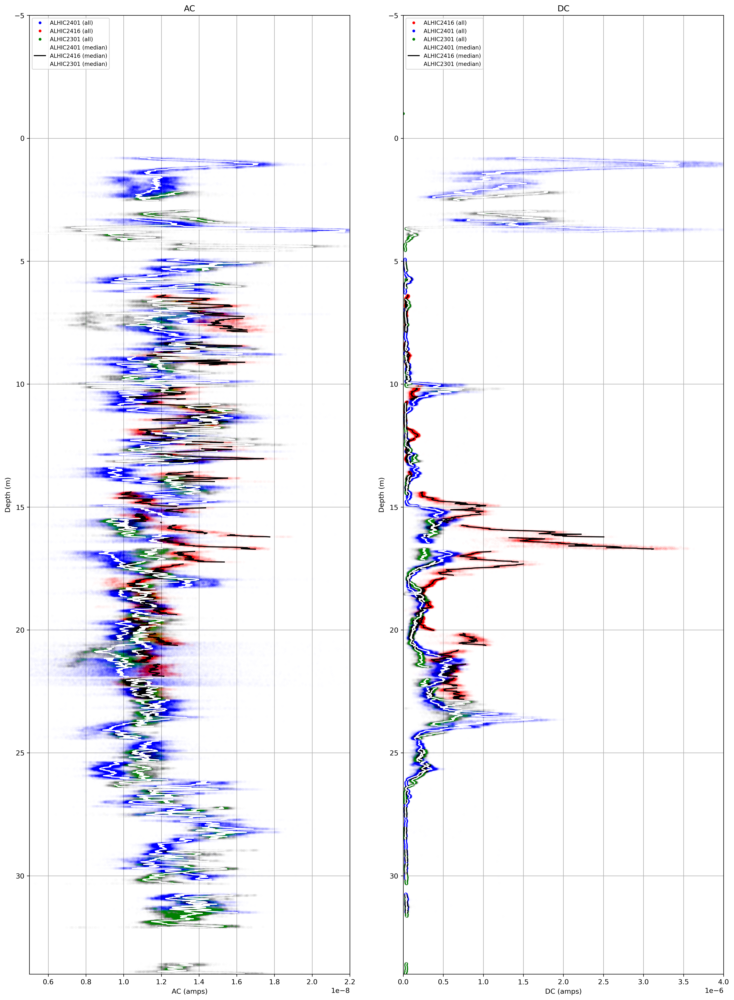

In [28]:
fig, ax = plt.subplots(
    1, 3, figsize=(18, 25), dpi=300,
    gridspec_kw={'width_ratios': [3, .5, 3]}
)

# turn off axis 2
ax[1].axis('off')

#shift = -18
shift_2416 = -3.5
shift_2401 = -0.8

# add shift to all 2416 depth lists
depth_alhic2416_AC_shifted = [d+shift_2416 for d in depth_alhic2416_AC]
depth_alhic2416_DC_shifted  = [d+shift_2416 for d in depth_alhic2416_DC]
AC_d_2416_shifted = [d+shift_2416 for d in AC_d_2416]
DC_d_2416_shifted = [d+shift_2416 for d in DC_d_2416]

# add shift to all 2401 depth lists
depth_alhic2401_AC_shifted = [d+shift_2401 for d in depth_alhic2401_AC]
depth_alhic2401_DC_shifted  = [d+shift_2401 for d in depth_alhic2401_DC]
AC_d_2401_shifted = [d+shift_2401 for d in AC_d_2401]
DC_d_2401_shifted = [d+shift_2401 for d in DC_d_2401]


for a in [ax[0],ax[2]]:
    a.set_ylabel('Depth (m)')
    a.set_ylim([34,-5])

# eliminate horizontal space between subplots 0,1 and 3,4
fig.subplots_adjust(wspace=0)

# plot all AC data on left
ax[0].plot(meas_ALHIC2401_AC, depth_alhic2401_AC_shifted, '.', alpha=0.002,color='blue')
ax[0].plot(meas_ALHIC2416_AC, depth_alhic2416_AC_shifted , '.', alpha = 0.002, color='red')
ax[0].plot(meas_ALHIC2301_AC, depth_alhic2301_AC, '.', alpha=0.002, color='green')
ax[0].plot([0, 0], [-1, -1], '.',color='blue', label='ALHIC2401 (all)')
ax[0].plot([0, 0], [-1, -1], '.',color='red', label='ALHIC2416 (all)')
ax[0].plot([0, 0], [-1, -1], '.',color='green', label='ALHIC2301 (all)')

# plot all DC data on right
ax[2].plot(meas_ALHIC2401_DC, depth_alhic2401_DC_shifted, '.', alpha=0.002, color='blue')
ax[2].plot(meas_ALHIC2416_DC, depth_alhic2416_DC_shifted, '.', alpha=0.002, color='red')
ax[2].plot(meas_ALHIC2301_DC, depth_alhic2301_DC, '.', alpha=0.002, color='green')
ax[2].plot([0, 0], [-1, -1], '.',color='red', label='ALHIC2416 (all)')
ax[2].plot([0, 0], [-1, -1], '.',color='blue', label='ALHIC2401 (all)')
ax[2].plot([0, 0], [-1, -1], '.',color='green', label='ALHIC2301 (all)')

# plot AC on left (2401 on ax 0 and 2416 on ax 1)
ax[0].plot(AC_m_2401, AC_d_2401_shifted, color='w', label='ALHIC2401 (median)')
ax[0].plot(AC_m_2416, AC_d_2416_shifted , color='k', label='ALHIC2416 (median)')
ax[0].plot(AC_m_2301, AC_d_2301, color='w', label='ALHIC2301 (median)')

# plot DC on right (2401 on ax 3 and 2416 on ax 4)
ax[2].plot(DC_m_2401, DC_d_2401_shifted, color='w', label='ALHIC2401 (median)')
ax[2].plot(DC_m_2416, DC_d_2416_shifted, color='k', label='ALHIC2416 (median)')
ax[2].plot(DC_m_2301, DC_d_2301, color='w', label='ALHIC2301 (median)')

# add subplot titles
ax[0].set_title('AC')
ax[2].set_title('DC')

# put DC on log scale
#ax[2].set_xscale('log')

# add x axis labels
ax[0].set_xlabel('AC (amps)')
ax[2].set_xlabel('DC (amps)')

# add legend
ax[0].legend(loc='upper left', fontsize=8)
ax[2].legend(loc='upper left', fontsize=8)

# add grid
ax[0].grid()
ax[2].grid()

# set x axis limits
ax[0].set_xlim([0.5*10**-8, 2.2*10**-8])
#ax[2].set_xlim([10**-8, 4*10**-6])
ax[2].set_xlim([0, 4*10**-6])

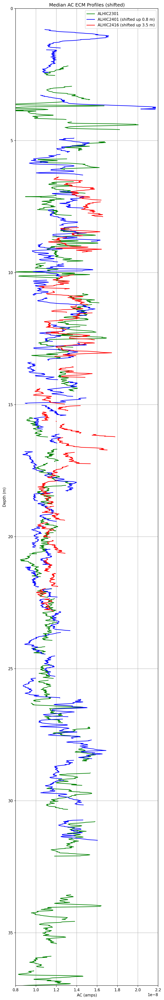

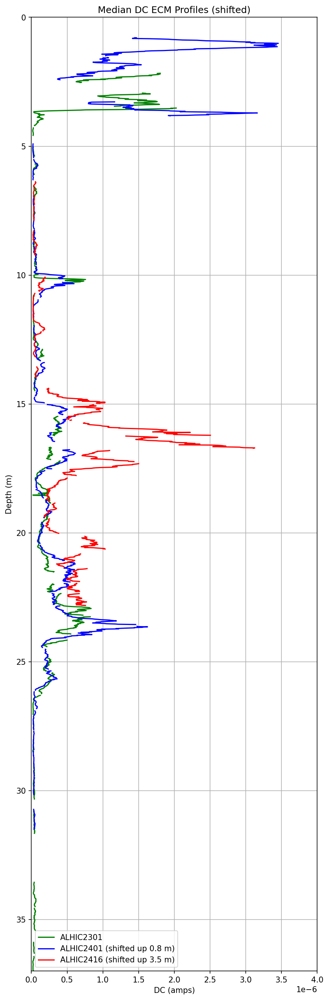

In [ ]:
# Simplified AC median plot with shifts
fig_ac, ax_ac = plt.subplots(figsize=(6, 6), dpi=150)
ax_ac.plot(AC_m_2301, AC_d_2301, color='green', label='ALHIC2301')
ax_ac.plot(AC_m_2401, AC_d_2401_shifted, color='blue', label='ALHIC2401 (shifted up '+str(shift_2401*-1)+ ' m)')
ax_ac.plot(AC_m_2416, AC_d_2416_shifted, color='red', label='ALHIC2416 (shifted up '+ str(shift_2416*-1)+ ' m)')
ax_ac.set_xlabel('AC (amps)')
ax_ac.set_ylabel('Depth (m)')
ax_ac.set_title('Median AC ECM Profiles (shifted)')
ax_ac.set_ylim([37, 0])
ax_ac.set_xlim([0.8e-8, 2.2e-8])
ax_ac.legend()
ax_ac.grid(True)
plt.tight_layout()

# Simplified DC median plot with shifts
fig_dc, ax_dc = plt.subplots(figsize=(6, 6), dpi=150)
ax_dc.plot(DC_m_2301, DC_d_2301, color='green', label='ALHIC2301')
ax_dc.plot(DC_m_2401, DC_d_2401_shifted, color='blue', label='ALHIC2401 (shifted up '+str(shift_2401*-1)+ ' m)')
ax_dc.plot(DC_m_2416, DC_d_2416_shifted, color='red', label='ALHIC2416 (shifted up '+ str(shift_2416*-1)+ ' m)')
ax_dc.set_xlabel('DC (amps)')
ax_dc.set_ylabel('Depth (m)')
ax_dc.set_title('Median DC ECM Profiles (shifted)')
ax_dc.set_ylim([37, 0])
ax_dc.set_xlim([0, 4e-6])
ax_dc.legend()
ax_dc.grid(True)
plt.tight_layout()

In [30]:
def get_slope(depth, meas, window=0.1, step=0.01):
    """
    Compute local slope of meas vs depth over a running 'window' (m)
    at increments 'step' (m). If any meas in the window is NaN, slope = NaN.
    """
    depth = np.asarray(depth)
    meas  = np.asarray(meas)
    order = np.argsort(depth)
    depth, meas = depth[order], meas[order]

    half = window/2
    d_centers = np.arange(depth.min()+half,
                          depth.max()-half+step/2,
                          step)

    slopes = []
    for c in d_centers:
        mask = (depth >= c-half) & (depth <= c+half)
        if mask.sum() >= 2:
            win = meas[mask]
            if np.isnan(win).any():
                slopes.append(np.nan)
            else:
                p = np.polyfit(depth[mask], win, 1)
                m = win.mean()
                slopes.append(p[0] / m)
        else:
            slopes.append(np.nan)

    return d_centers, slopes

In [31]:
# compute slopes
d_centers_2401_AC, slopes_AC_2401 = get_slope(AC_d_2401, AC_m_2401, window=0.2, step=0.01)
d_centers_2416_AC, slopes_AC_2416 = get_slope(AC_d_2416, AC_m_2416, window=0.2, step=0.01)

# compute DC slopes
d_centers_2401_DC, slopes_DC_2401 = get_slope(DC_d_2401, DC_m_2401, window=0.2, step=0.01)
d_centers_2416_DC, slopes_DC_2416 = get_slope(DC_d_2416, DC_m_2416, window=0.2, step=0.01)



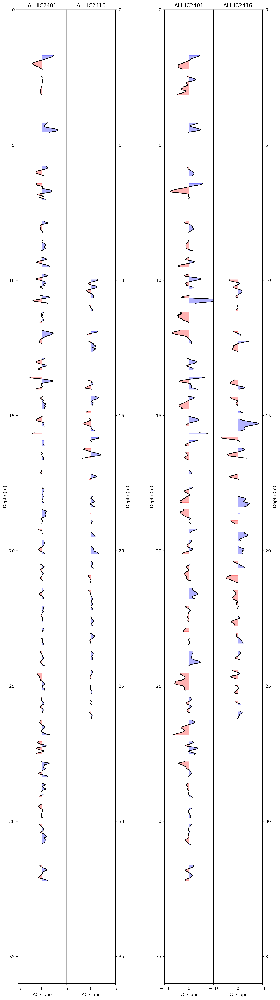

In [32]:
# shift depth for 2416
shift = -0
d_centers_2416_AC_shifted = [d+shift for d in d_centers_2416_AC]
d_centers_2416_DC_shifted = [d+shift for d in d_centers_2416_DC]


fig, ax = plt.subplots(1, 5, figsize=(10, 40), dpi=300)

# turn off middle axis
ax[2].axis('off')

# flip right‐side y-axes
for i in (1,4):
    ax[i].yaxis.tick_right()
    ax[i].yaxis.set_label_position("right")

# common y‐labels & limits
for i in (0,1,3,4):
    ax[i].set_ylabel('Depth (m)')
    ax[i].set_ylim([36,0])

fig.subplots_adjust(wspace=0)

# plot AC slopes
ax[0].plot(slopes_AC_2401, d_centers_2401_AC, color='k', label='AC slope')
ax[1].plot(slopes_AC_2416, d_centers_2416_AC_shifted, color='k', label='AC slope')

# shade AC positive/negative
ax[0].fill_betweenx(d_centers_2401_AC, 0, slopes_AC_2401,
                    where=np.array(slopes_AC_2401) >= 0,
                    color='blue', alpha=0.3)
ax[0].fill_betweenx(d_centers_2401_AC, 0, slopes_AC_2401,
                    where=np.array(slopes_AC_2401) <= 0,
                    color='red', alpha=0.3)

ax[1].fill_betweenx(d_centers_2416_AC_shifted, 0, slopes_AC_2416,
                    where=np.array(slopes_AC_2416) >= 0,
                    color='blue', alpha=0.3)
ax[1].fill_betweenx(d_centers_2416_AC_shifted, 0, slopes_AC_2416,
                    where=np.array(slopes_AC_2416) <= 0,
                    color='red', alpha=0.3)

# plot DC slopes
ax[3].plot(slopes_DC_2401, d_centers_2401_DC, color='k', label='DC slope')
ax[4].plot(slopes_DC_2416, d_centers_2416_DC_shifted, color='k', label='DC slope')

# shade DC positive/negative
ax[3].fill_betweenx(d_centers_2401_DC, 0, slopes_DC_2401,
                    where=np.array(slopes_DC_2401) >= 0,
                    color='blue', alpha=0.3)
ax[3].fill_betweenx(d_centers_2401_DC, 0, slopes_DC_2401,
                    where=np.array(slopes_DC_2401) <= 0,
                    color='red', alpha=0.3)

ax[4].fill_betweenx(d_centers_2416_DC_shifted, 0, slopes_DC_2416,
                    where=np.array(slopes_DC_2416) >= 0,
                    color='blue', alpha=0.3)
ax[4].fill_betweenx(d_centers_2416_DC_shifted, 0, slopes_DC_2416,
                    where=np.array(slopes_DC_2416) <= 0,
                    color='red', alpha=0.3)

# titles
ax[0].set_title('ALHIC2401')
ax[1].set_title('ALHIC2416')
ax[3].set_title('ALHIC2401')
ax[4].set_title('ALHIC2416')

# x labels
ax[0].set_xlabel('AC slope')
ax[1].set_xlabel('AC slope')
ax[3].set_xlabel('DC slope')
ax[4].set_xlabel('DC slope')

# keep DC on log if you like (optional)
#ax[3].set_xscale('log')
#ax[4].set_xscale('log')

for a in [ax[0],ax[1]]:
    mag = 5
    a.set_xlim([-mag, mag])

for a in [ax[3],ax[4]]:
    mag = 10
    a.set_xlim([-mag, mag])


Best shift = 18.112000000000002 m (RMSE = 4.281e-01)


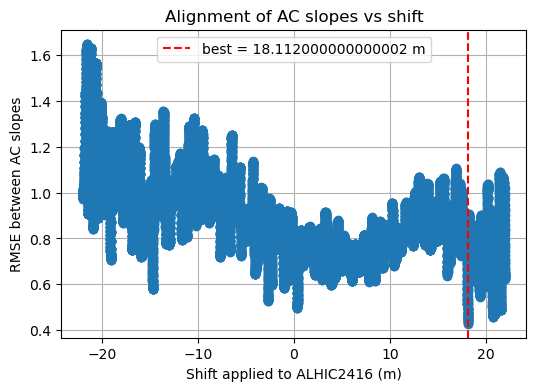

In [33]:
# test shifts to align ALHIC2416 AC slopes to ALHIC2401 AC slopes
#shifts = np.arange(-10, 10.1, 0.1)  # shifts from -10 to +10 m
shifts = np.linspace(-22, 22, 22001)  # shifts from -10 to +10 m
errors = []

# arrays of centers and slopes for convenience
centers2401 = np.array(d_centers_2401_AC)
slopes2401 = np.array(slopes_AC_2401)
centers2416 = np.array(d_centers_2416_AC)
slopes2416 = np.array(slopes_AC_2416)

for s in shifts:
    # shift 2416 centers
    shifted = centers2416 + s
    # interpolate 2416 slopes onto 2401 depth grid
    interp2416 = np.interp(centers2401, shifted, slopes2416,
                           left=np.nan, right=np.nan)
    # compute RMSE where both series are valid
    valid = ~np.isnan(interp2416) & ~np.isnan(slopes2401)
    rmse = np.sqrt(np.mean((interp2416[valid] - slopes2401[valid])**2))
    errors.append(rmse)

# find best shift
best_idx = int(np.nanargmin(errors))
best_shift = shifts[best_idx]
best_rmse = errors[best_idx]
print(f"Best shift = {best_shift} m (RMSE = {best_rmse:.3e})")

# plot RMSE vs shift
plt.figure(figsize=(6,4))
plt.plot(shifts, errors, '-o')
plt.axvline(best_shift, color='red', linestyle='--',
            label=f'best = {best_shift} m')
plt.xlabel('Shift applied to ALHIC2416 (m)')
plt.ylabel('RMSE between AC slopes')
plt.title('Alignment of AC slopes vs shift')
plt.legend()
plt.grid(True)
plt.show()

Best shift (DC) = 21.232 m (RMSE = 7.195e-01)


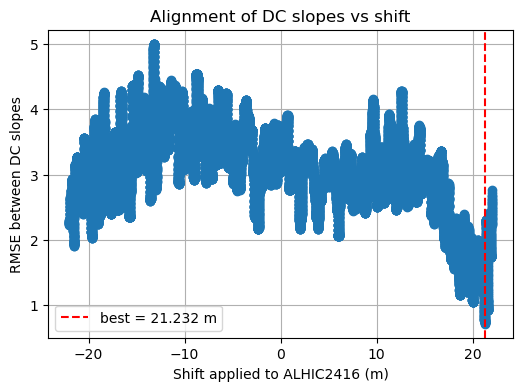

In [34]:
# test shifts to align ALHIC2416 DC slopes to ALHIC2401 DC slopes
shifts = np.linspace(-22, 22, 22001)  # shifts from -10 to +10 m
errors = []

centers2401 = np.array(d_centers_2401_DC)
slopes2401  = np.array(slopes_DC_2401)
centers2416 = np.array(d_centers_2416_DC)
slopes2416  = np.array(slopes_DC_2416)

for s in shifts:
    shifted = centers2416 + s
    interp2416 = np.interp(centers2401, shifted, slopes2416,
                           left=np.nan, right=np.nan)
    valid = ~np.isnan(interp2416) & ~np.isnan(slopes2401)
    rmse = np.sqrt(np.mean((interp2416[valid] - slopes2401[valid])**2))
    errors.append(rmse)

best_idx   = int(np.nanargmin(errors))
best_shift = shifts[best_idx]
best_rmse  = errors[best_idx]
print(f"Best shift (DC) = {best_shift} m (RMSE = {best_rmse:.3e})")

# plot RMSE vs shift for DC
plt.figure(figsize=(6,4))
plt.plot(shifts, errors, '-o')
plt.axvline(best_shift, color='red', linestyle='--',
            label=f'best = {best_shift} m')
plt.xlabel('Shift applied to ALHIC2416 (m)')
plt.ylabel('RMSE between DC slopes')
plt.title('Alignment of DC slopes vs shift')
plt.legend()
plt.grid(True)
plt.show()